# Регрессионный анализ

**Задача:** подобрать датасет, на основе данных сделать гипотезу по регрессионной модели, которую затем проверить.

**Выполнили:**
- Антропова Ольга
- Здрогова Дарья
- Смолин Павел
- Фаттахов Марат

### Описание данных

Работать будем с данными о добыче газа, данные находятся в нескольких таблицах. 

**Имеется набор признаков:**
- Р1 - давление на устье (`PT-1044_01.txt`)
- Т1 - температура на устье (`TT-1044_01.txt`)
- Р2 - давление до дросселя (устройство для понижения давления газа при протекании через сужение проходного канала трубопровода) (`PT-1044_02.txt`)
- Т2 - температура до дросселя (`TT-1044_02.txt`)
- Р3 - давление после дросселя (`PT-1044_03.txt`)
- Т3 - температура после дросселя (`TT-1044_03.txt`)
- TA - температура окружающей среды (`T_AIR.txt`)
- TG - температура грунта (`T_GRO.txt`)
- PO - давление окружающей среды (`PIT-5173.txt`)
- QG - объем добываемого газа (дебит) (`FTG.txt`)

**Вспомогательные данные:**
- `well_selected.txt` - отметки о скважинах, которые находились на замере в данный период времени.

Каждый файл с данными представляет собой временные метки (каждые 30 минут) и значение соответствующего параметра на момент замера.

**Задача:** выдвинуть гипотезу и на ее основе создать модель, которая бы помогала прогнозировать значение добываемого газа по приведенным выше признакам.

### Обработка данных

Перед началом работы необходимо собрать все признаки и целевую переменную (дебит) в один датасет для удобства дальнейшей работы.

Сначала работаем с файлом `well_selected.txt`, в котором мы заменяем на пустые значения все отметки о скважинах, с которыми мы не работаем (наши наборы данных - измерения показатель работы скважины №1044). Этот датасет с временными отметками мы берем за основу при соединении всех параметров в один датасет.

Далее для каждого параметра необходимо провести чистку данных. Для этого нужно загрузить каждый набор, представить его в виде датасета, удалить строчки с пустыми ячейками. А затем присоединить к нашему датасету из предыдущего шага, интерполируя по времени.

Построим графики, чтобы визуализировать наши данные, также по ним будет удобно выявить наличие сильных выбросов в данных (результаты измерения, которые выделяются из общей выборки).

Получаем следующие графики для наших "сырых" наборов данных:

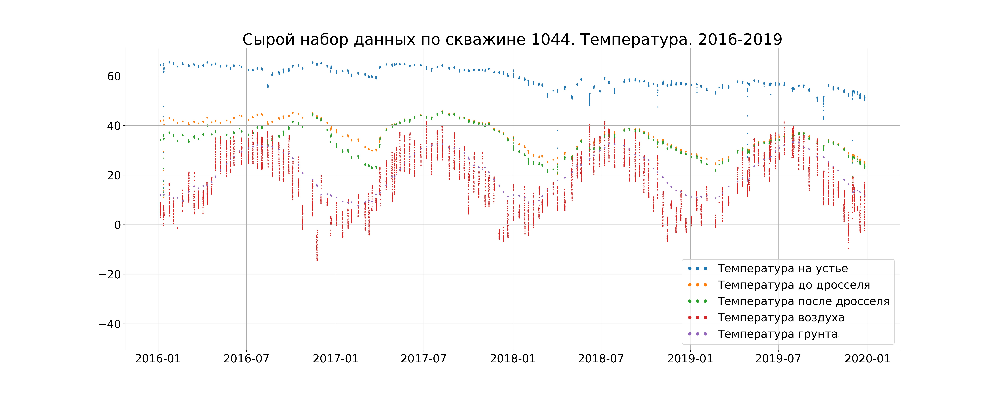

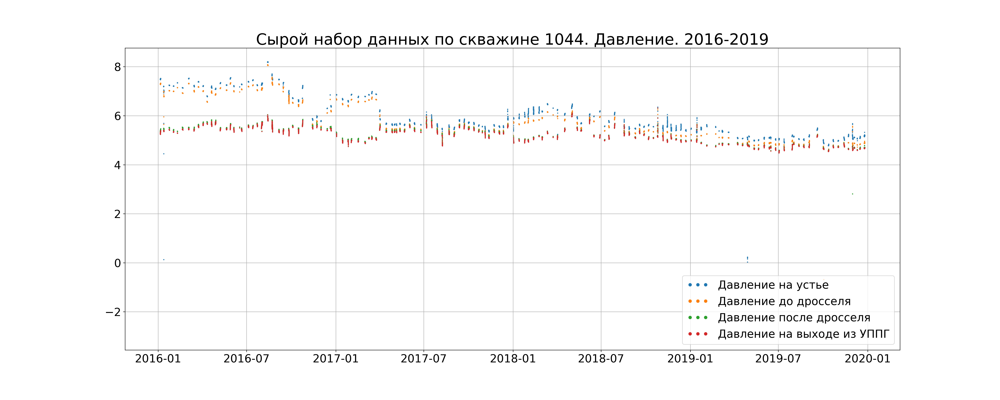

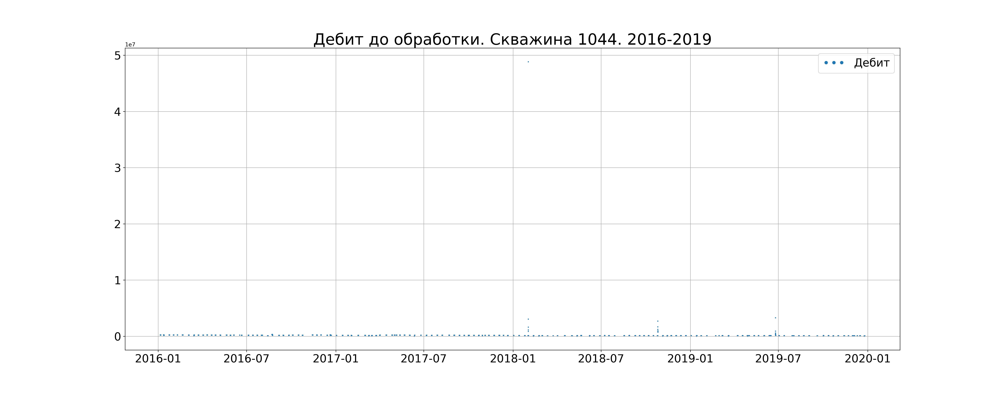

Как видим, имеются выбросы в данных, чтобы от них избавиться, просто зададим диапазон тех значений, которые нас устраивают для каждого параметра, и отфильтруем наши данные.

Пример установления диапазона значений для температуры на устье:
```
dfm = dfm[~(dfm.T1 > 75)]
dfm = dfm[~(dfm.T1 < 40)]
```

Получаем следующие наборы данных после обработки:

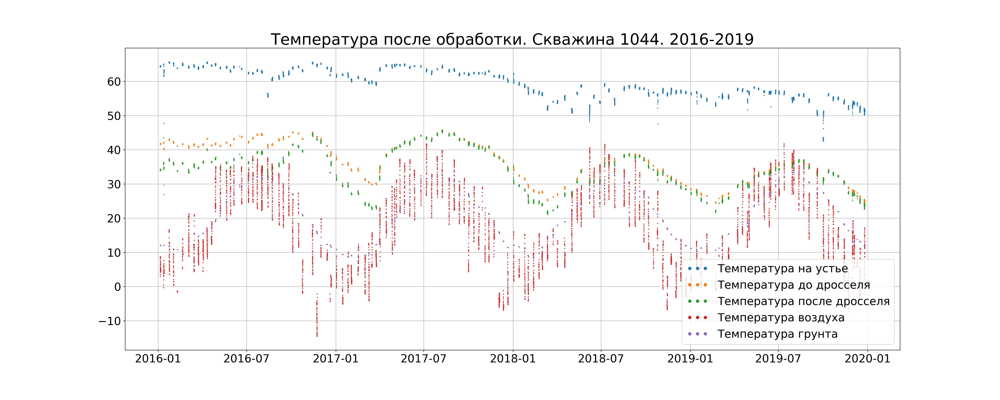

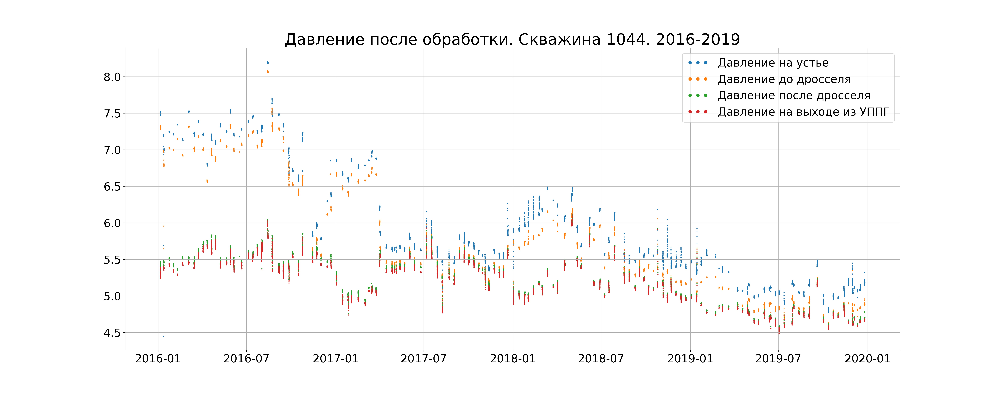

Для обработки дебита скважины мы удаляем пустые значения и добавляем его к набору параметров.

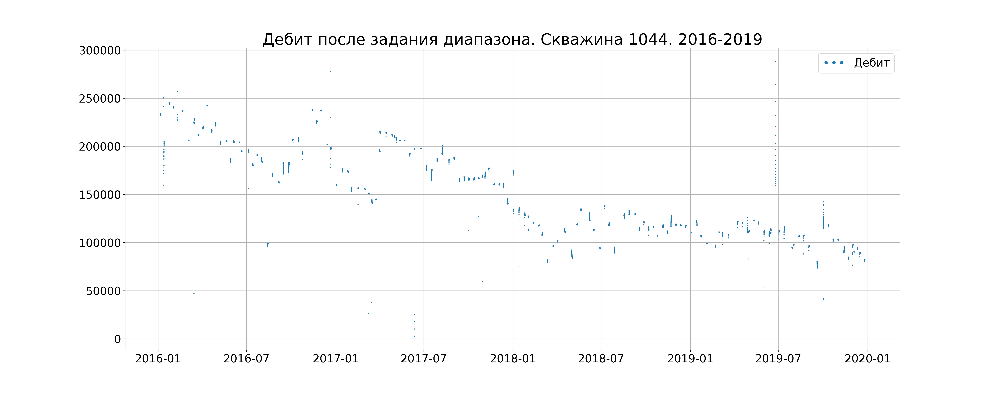

### Анализ данных

Продолжаем работу уже с чистыми данными, построим темпловую карту корреляции, чтобы посмотреть, есть ли линейная зависимость между каким-либо параметром и нашей целевой переменной.

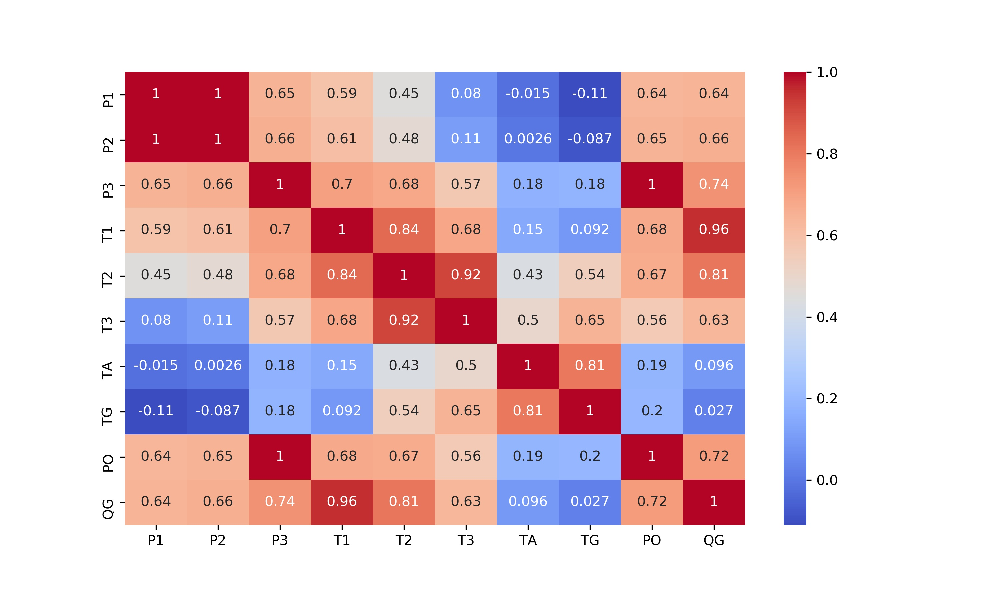

Как видим, температура до устья (`Т1`) имеет самое высокое значение коэффициента корреляции для дебита. Построим отдельный график зависимости этих двух параметров.

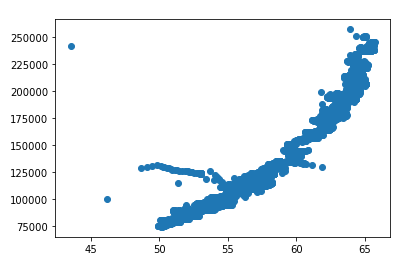

На основе графика выдвинем **гипотезу, что для нашего набора данных подойдет полиномиальная регрессия**, так как она хорошо опишет зависимость между параметром, который сильнее всего коррелирует с целевой переменной, и дебитом.

Помимо сравнения полиномиальной и линейной регрессии, произведем дополнительный отбор данных с помощью вспомогательной модели случайного леса.

Обучим на нашем наборе данных 200 деревьев (глубиной не больше 5 узлов) и построим диаграмму, чтобы увидеть, какие коэффициенты получили самый высокий вес.

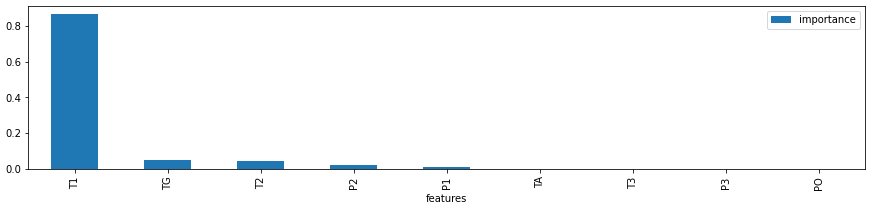

Как видим, наибольшие коэффициенты получили следующие параметры: 
- T1
- TG
- T2
- P2
- P1

Попробуем обучить нашу модель только на приведенных выше признаках.

### Обучение моделей

Для подтверждения или опровержения нашей гипотезы создадим и обучим:
- линейную регрессию
- полиномиальную регрессию
- полиномиальную регрессию с ограниченным набором параметров.

Для обучения всех моделей используем библиотеку sklearn.

### Результаты эксперимента

Для оценки работы линейной регрессии будем использовать метрику `MAE` (средний модуль отклонения).

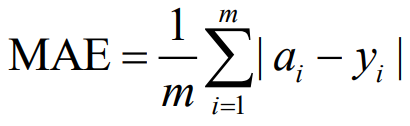

`MAE` для линейной регрессии составило: 8769.996

Теперь обучим полином с помощью той же библиотеки sklearn и подсчитаем `MAE` для нее: 7910.433

Теперь обучим полином, но уже на ограниченном наборе данных. Выберем те признаки, которые получили наибольший коэффициент при обучении случайного леса.

Для этой модели мы получаем `MAE` = 5774.192

Как мы видим,**наша гипотеза подтвердилась**: полиномиальная регрессия справляется с описанием наших данных лучше, чем линейная. При этом с ограничением используемых признаков мы получаем наилучший результат, так как модель не принимаем в расчет те признаки, коорые влияют на целевую переменную лишь косвенно или не влияют вовсе. 